In [12]:
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

In [13]:
from IPython.display import Image as WImage, display

In [14]:
import os

In [15]:
import os.path

In [16]:
from pathlib import Path

In [17]:
import random

In [18]:
import glob

In [19]:
from PIL import Image

ModuleNotFoundError: No module named 'PIL'

In [ ]:
import cv2

In [ ]:
import imageio

In [ ]:
from matplotlib import colors

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import seaborn as sns

In [ ]:
import numpy as np

In [ ]:
import pandas as pd

In [ ]:
import skimage

In [ ]:
from skimage import data, io, filters

In [ ]:
from skimage.feature import hessian_matrix, hessian_matrix_eigvals

In [ ]:
from skimage.morphology import convex_hull_image, erosion

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler 

In [ ]:
from tensorflow.keras.models import Sequential, Model, load_model

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda

In [ ]:
from tensorflow.keras.layers import ReLU

In [ ]:
from tensorflow.keras import backend as K

In [ ]:
from tensorflow.keras.utils import to_categorical, Sequence

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping ,ReduceLROnPlateau ,ModelCheckpoint

In [ ]:
from tensorflow.keras.optimizers import Adam

In [ ]:
os.environ["SM_FRAMEWORK"] = "tf.keras"

In [ ]:
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:
base_dir = "Dataset/train_val"

In [ ]:
filenames = os.listdir(os.path.join(base_dir,'images'))
filenames = [x for x in filenames if x.endswith('jpg')]
print(len(filenames))
nums = random.sample(range(len(filenames)),10)

1525


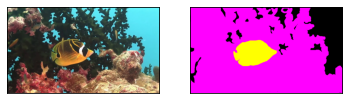

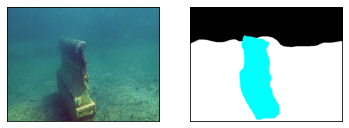

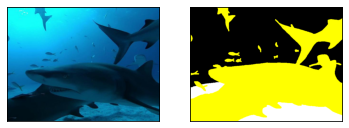

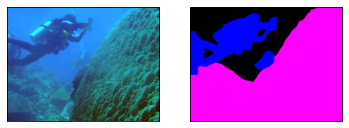

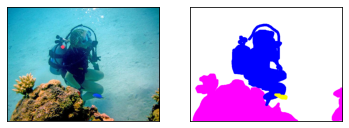

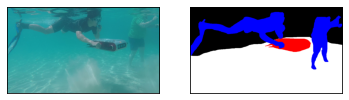

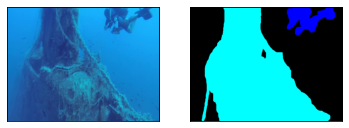

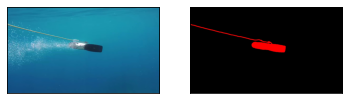

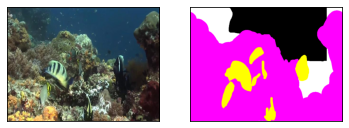

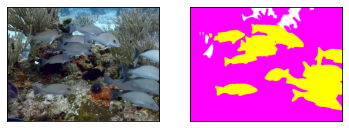

In [ ]:
for num in nums:
    filename = filenames[num]
    img = imageio.imread(os.path.join(base_dir,'images', filename))
    lab = imageio.imread(os.path.join(base_dir,'masks', filename[:-3] + 'bmp'))
    plt.figure()
    ax = plt.subplot(121)
    plt.imshow(img)
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    ax = plt.subplot(122)
    plt.imshow(lab)
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    plt.savefig(f"Output/EDA/Images-Mask-R-{num}.png")

In [ ]:
images_path_list = Path("Dataset/train_val/images")

In [ ]:
jpg_path_list = list(images_path_list.glob(r"*.jpg"))

In [ ]:
print(len(jpg_path_list))

1525


In [ ]:
jpg_path_list = sorted(jpg_path_list)

In [ ]:
bmp_path_list_list = Path("Dataset/train_val/masks")

In [ ]:
bmp_path_list = list(bmp_path_list_list.glob(r"*.bmp"))

In [ ]:
print(len(bmp_path_list))

1525


In [ ]:
bmp_path_list = sorted(bmp_path_list)

In [ ]:
objects_df = pd.Series(jpg_path_list,name="OBJECTS").astype(str)

In [ ]:
masks_df = pd.Series(bmp_path_list,name="MASK").astype(str)

In [ ]:
objects_df

0       Dataset\train_val\images\d_r_103_.jpg
1       Dataset\train_val\images\d_r_105_.jpg
2       Dataset\train_val\images\d_r_112_.jpg
3       Dataset\train_val\images\d_r_113_.jpg
4       Dataset\train_val\images\d_r_125_.jpg
                        ...                  
1520     Dataset\train_val\images\w_r_95_.jpg
1521     Dataset\train_val\images\w_r_96_.jpg
1522     Dataset\train_val\images\w_r_98_.jpg
1523     Dataset\train_val\images\w_r_99_.jpg
1524      Dataset\train_val\images\w_r_9_.jpg
Name: OBJECTS, Length: 1525, dtype: object

In [ ]:
masks_df

0       Dataset\train_val\masks\d_r_103_.bmp
1       Dataset\train_val\masks\d_r_105_.bmp
2       Dataset\train_val\masks\d_r_112_.bmp
3       Dataset\train_val\masks\d_r_113_.bmp
4       Dataset\train_val\masks\d_r_125_.bmp
                        ...                 
1520     Dataset\train_val\masks\w_r_95_.bmp
1521     Dataset\train_val\masks\w_r_96_.bmp
1522     Dataset\train_val\masks\w_r_98_.bmp
1523     Dataset\train_val\masks\w_r_99_.bmp
1524      Dataset\train_val\masks\w_r_9_.bmp
Name: MASK, Length: 1525, dtype: object

In [ ]:
main_df = pd.concat([objects_df,masks_df],axis=1)

In [ ]:
main_df

,OBJECTS,MASK
0,Dataset\train_val\images\d_r_103_.jpg,Dataset\train_val\masks\d_r_103_.bmp
1,Dataset\train_val\images\d_r_105_.jpg,Dataset\train_val\masks\d_r_105_.bmp
2,Dataset\train_val\images\d_r_112_.jpg,Dataset\train_val\masks\d_r_112_.bmp
3,Dataset\train_val\images\d_r_113_.jpg,Dataset\train_val\masks\d_r_113_.bmp
4,Dataset\train_val\images\d_r_125_.jpg,Dataset\train_val\masks\d_r_125_.bmp
...,...,...
1520,Dataset\train_val\images\w_r_95_.jpg,Dataset\train_val\masks\w_r_95_.bmp
1521,Dataset\train_val\images\w_r_96_.jpg,Dataset\train_val\masks\w_r_96_.bmp
1522,Dataset\train_val\images\w_r_98_.jpg,Dataset\train_val\masks\w_r_98_.bmp
1523,Dataset\train_val\images\w_r_99_.jpg,Dataset\train_val\masks\w_r_99_.bmp


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][12]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][12]),cv2.COLOR_BGR2RGB)

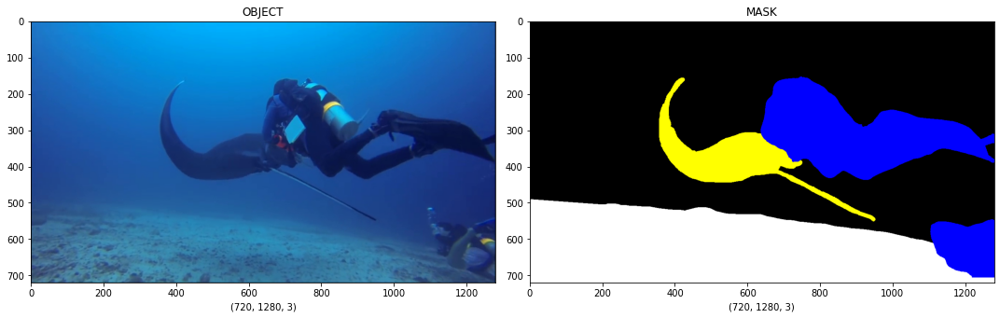

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-A01.png")
plt.show()


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][1112]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][1112]),cv2.COLOR_BGR2RGB)

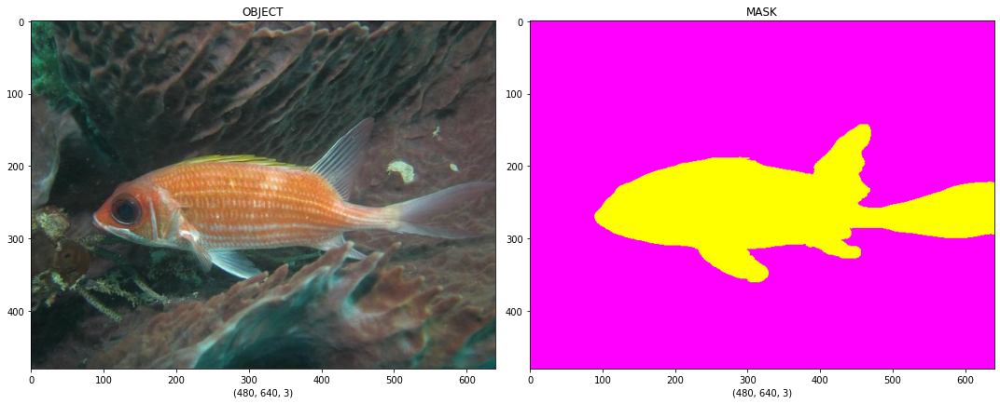

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-A02.png")
plt.show()


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][1445]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][1445]),cv2.COLOR_BGR2RGB)

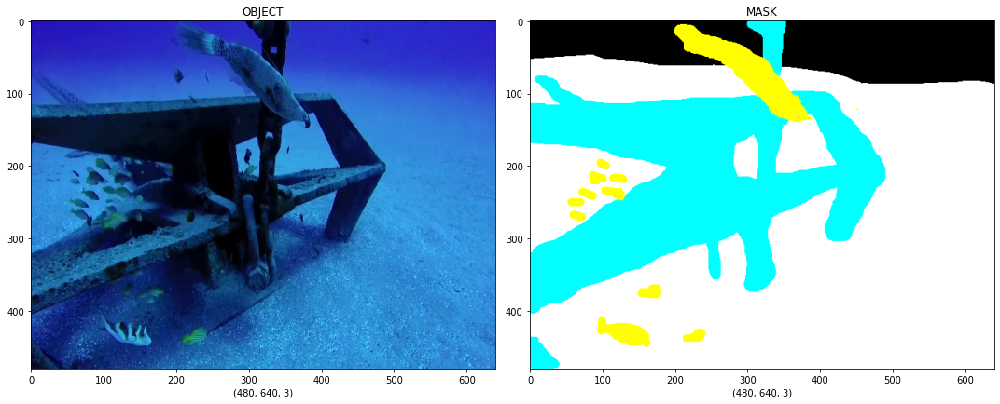

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-A03.png")
plt.show()


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][5]),cv2.COLOR_BGR2RGB)

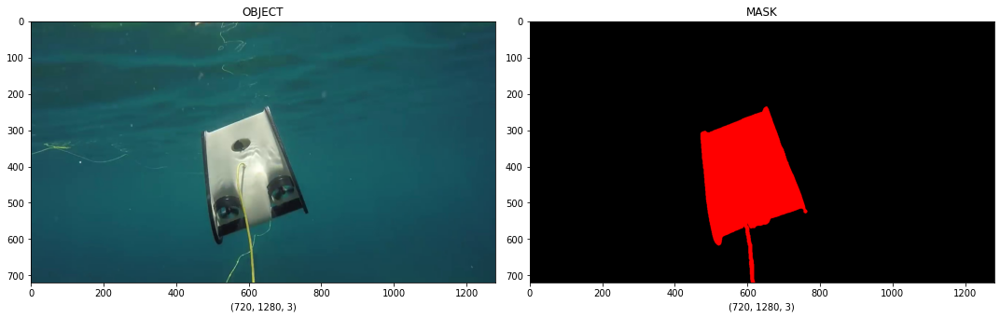

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-A04.png")
plt.show()


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][166]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][166]),cv2.COLOR_BGR2RGB)

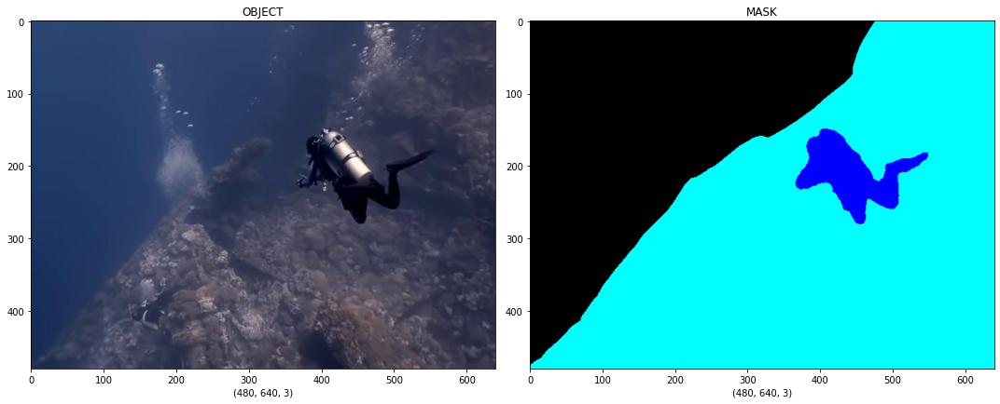

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-A05.png")
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][335]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][335]),cv2.COLOR_BGR2RGB)

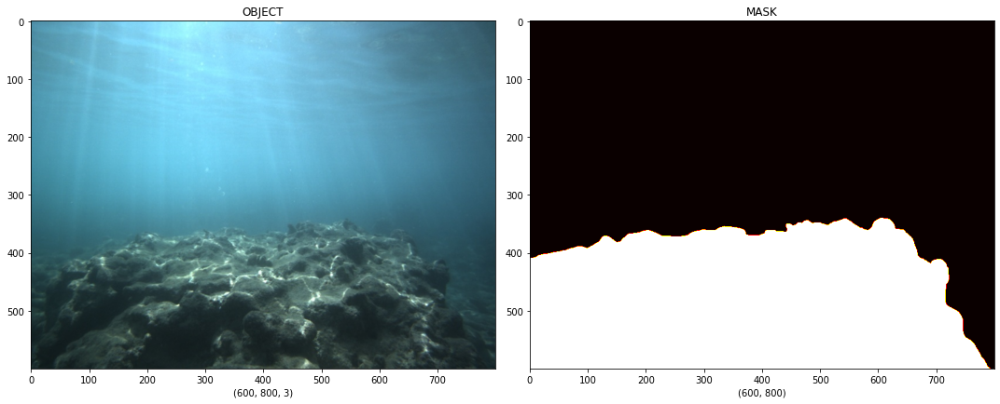

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask[:,:,0],cmap="hot")
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-A06.png")
plt.show()


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 0] = 0

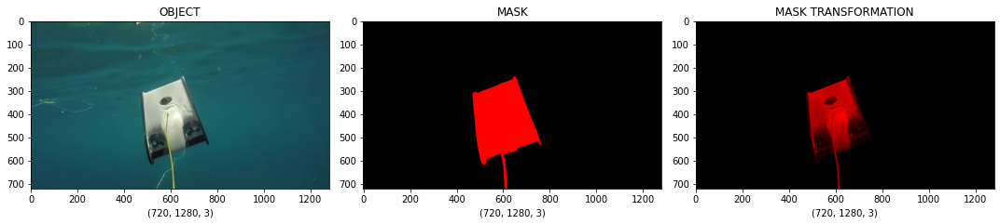

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANSFORMATION")
axis[2].imshow(COPY_OBJECT)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-Transformation-T01.png")
plt.show()


In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 0] = 0

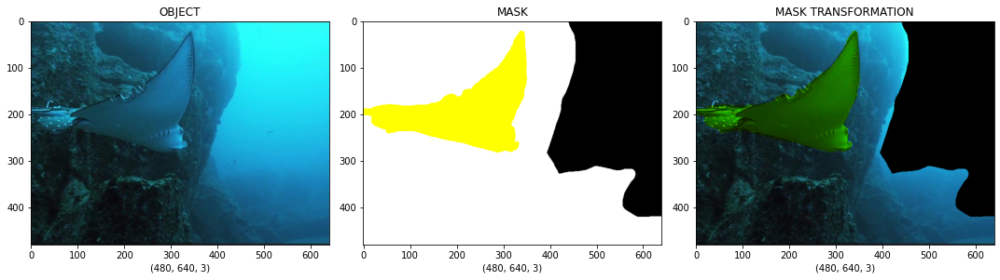

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANSFORMATION")
axis[2].imshow(COPY_OBJECT)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-Transformation-T02.png")
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 0] = 255

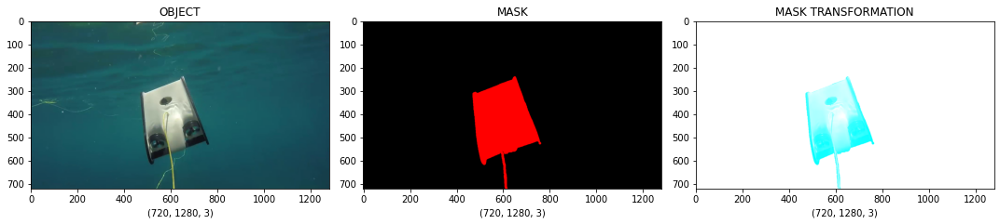

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANSFORMATION")
axis[2].imshow(COPY_OBJECT)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-Transformation-T03.png")
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 0] = 255

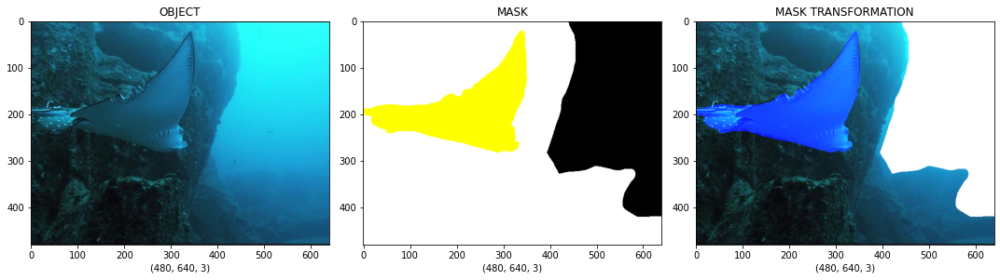

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANSFORMATION")
axis[2].imshow(COPY_OBJECT)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-Transformation-T04.png")
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 255] = 0

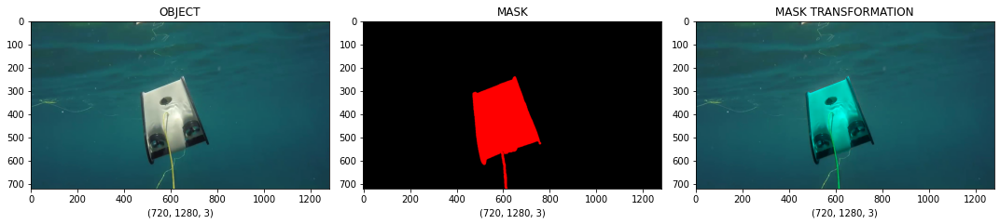

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANSFORMATION")
axis[2].imshow(COPY_OBJECT)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-Transformation-T05.png")
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 255] = 0

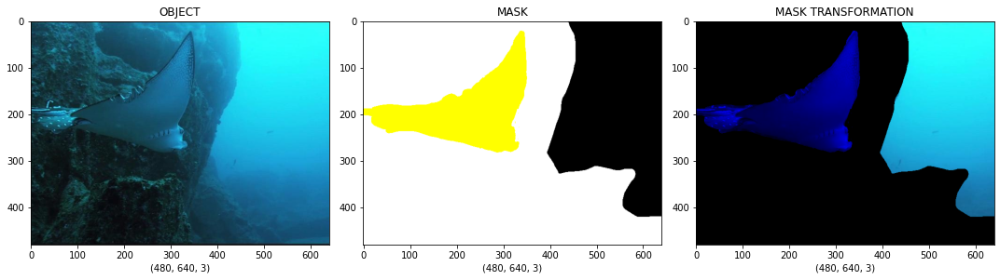

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask.shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANSFORMATION")
axis[2].imshow(COPY_OBJECT)
plt.tight_layout()
plt.savefig("Output/EDA/Objecct-Mask-Transformation-T06.png")
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][5]),cv2.COLOR_BGR2RGB)

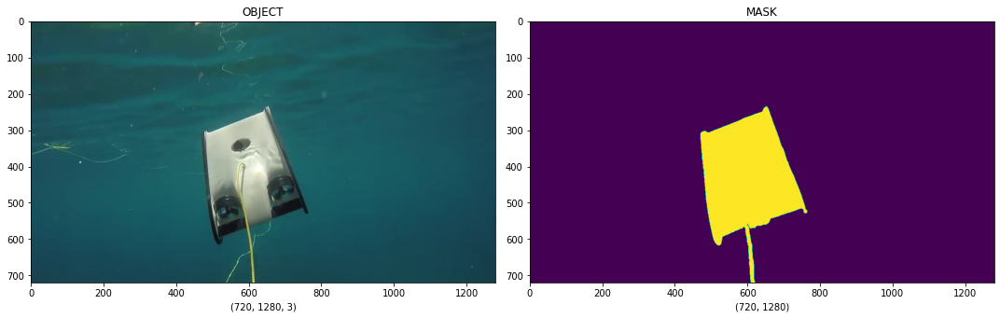

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][877]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][877]),cv2.COLOR_BGR2RGB)

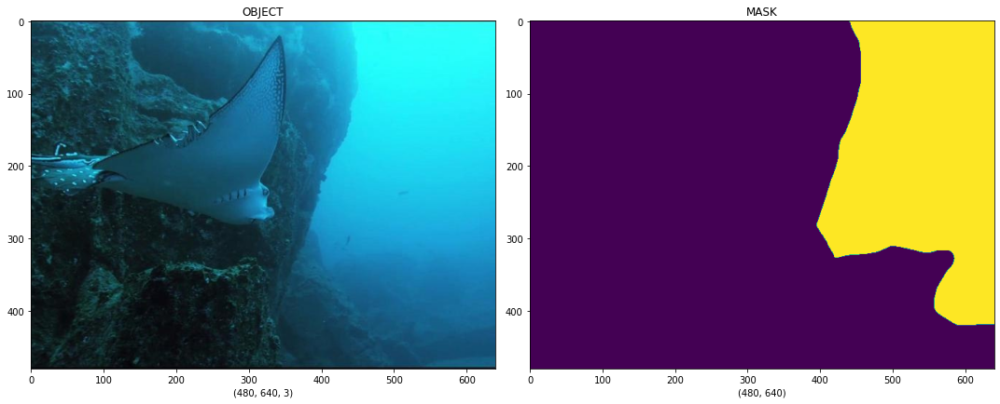

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("MASK")
axis[1].imshow(sample_mask[:,:,0] == 0)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][5]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [255,0,0]

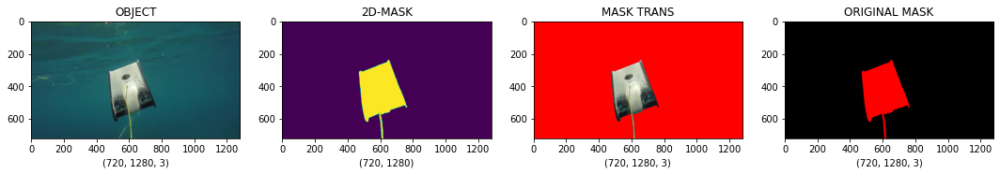

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][15]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][15]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [255,0,0]

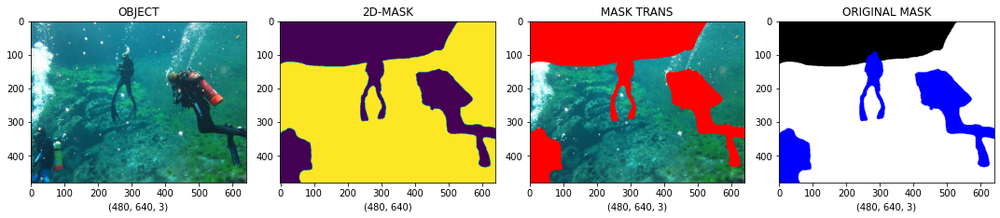

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][185]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][185]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [255,0,0]

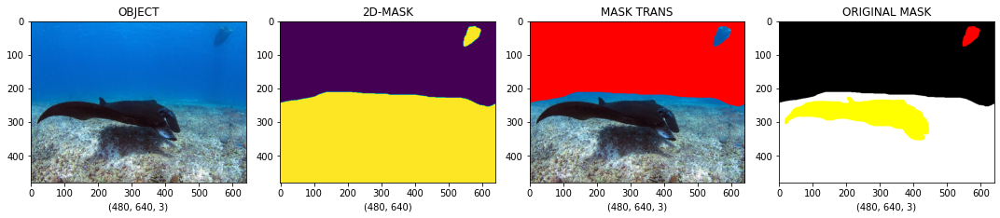

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][1000]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][1000]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [255,0,0]

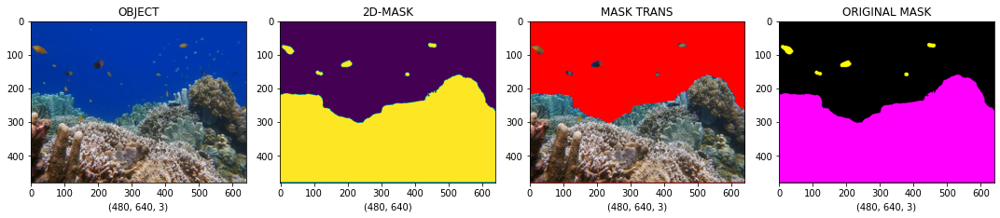

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [255,0,0]

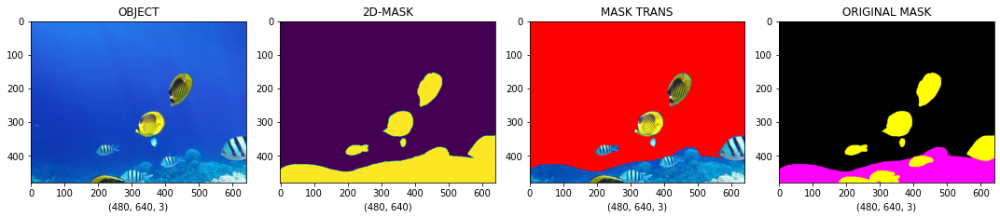

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][1500]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][1500]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS == 0] = [255,0,0]

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS == 1] = [0,255,0]

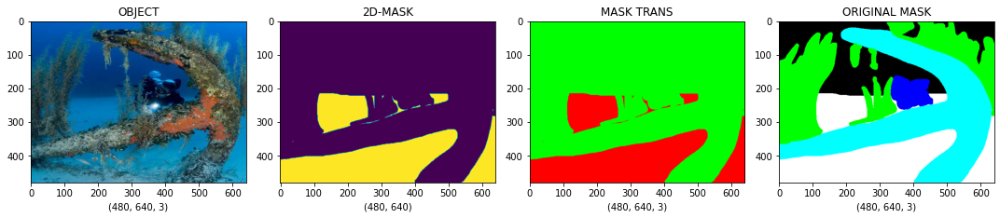

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][741]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][741]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 0

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS == 0] = [255,0,0]

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS == 1] = [0,255,0]

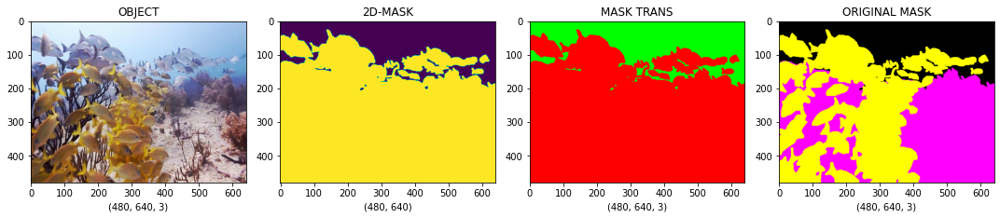

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(sample_mask[:,:,0].shape)
axis[1].set_title("2D-MASK")
axis[1].imshow(sample_mask[:,:,0] == 255)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 255

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [100,255,100]

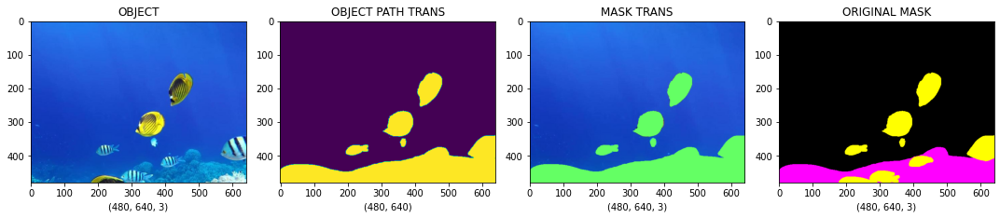

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][330]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][330]),cv2.COLOR_BGR2RGB)

In [ ]:
jpg_path_list_TRANS = sample_mask[:,:,0] == 255

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[jpg_path_list_TRANS] = [0,255,0]

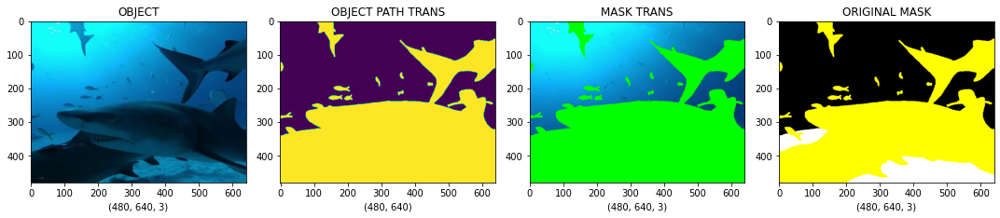

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(COPY_OBJECT.shape)
axis[2].set_title("MASK TRANS")
axis[2].imshow(COPY_OBJECT)
axis[3].set_xlabel(sample_mask.shape)
axis[3].set_title("ORIGINAL MASK")
axis[3].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][3]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
Pixel_Colors_I = sample_image.reshape((np.shape(sample_image)[0] * np.shape(sample_image)[1], 3))

In [ ]:
Normalize_I = colors.Normalize(vmin=-1.,vmax=1.)

In [ ]:
Normalize_I.autoscale(Pixel_Colors_I)

In [ ]:
Result_Pixel = Normalize_I(Pixel_Colors_I).tolist()

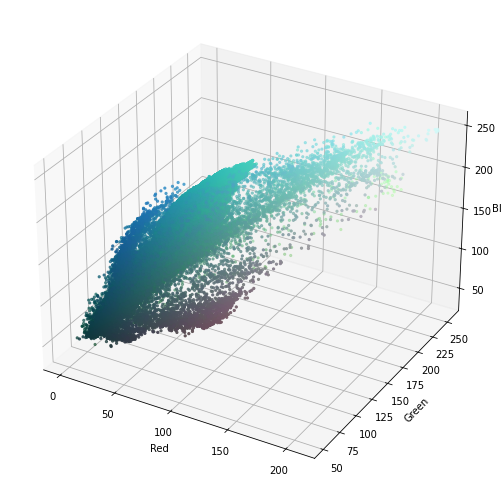

In [ ]:
figure = plt.figure(figsize=(7,7))
axis_func = figure.add_subplot(1, 1, 1, projection="3d")
axis_func.scatter(Red_I.flatten(), Green_I.flatten(), Blue_I.flatten(), facecolors=Result_Pixel, marker=".")
axis_func.set_xlabel("Red")
axis_func.set_ylabel("Green")
axis_func.set_zlabel("Blue")
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
Pixel_Colors_I = sample_image.reshape((np.shape(sample_image)[0] * np.shape(sample_image)[1], 3))

In [ ]:
Normalize_I = colors.Normalize(vmin=-1.,vmax=1.)

In [ ]:
Normalize_I.autoscale(Pixel_Colors_I)

In [ ]:
Result_Pixel = Normalize_I(Pixel_Colors_I).tolist()

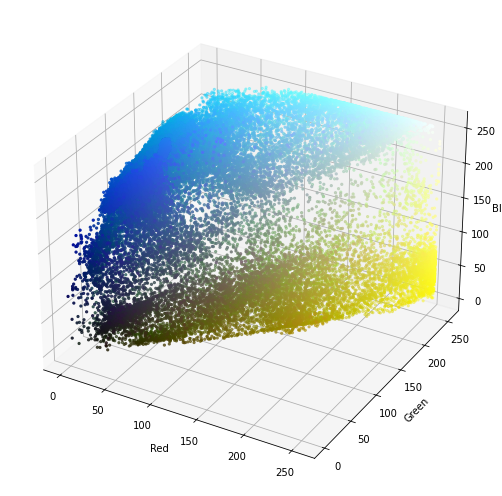

In [ ]:
figure = plt.figure(figsize=(7,7))
axis_func = figure.add_subplot(1, 1, 1, projection="3d")
axis_func.scatter(Red_I.flatten(), Green_I.flatten(), Blue_I.flatten(), facecolors=Result_Pixel, marker=".")
axis_func.set_xlabel("Red")
axis_func.set_ylabel("Green")
axis_func.set_zlabel("Blue")
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][885]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,0] - Blue_I

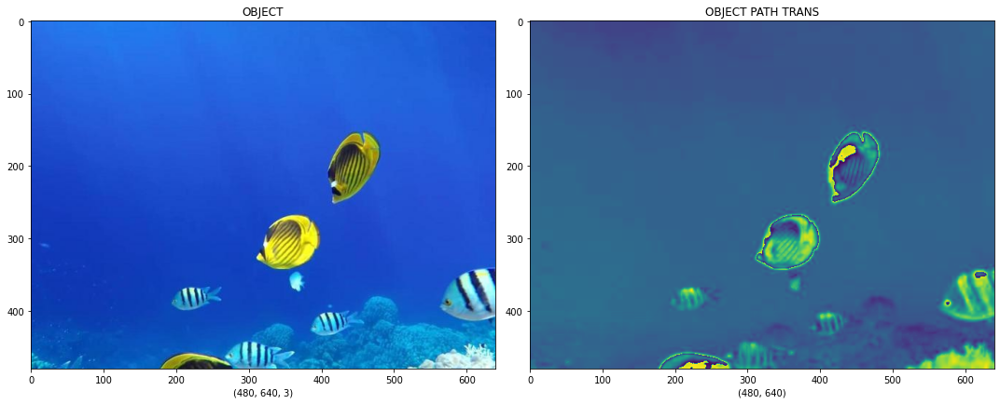

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][7]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][7]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,0] - Green_I

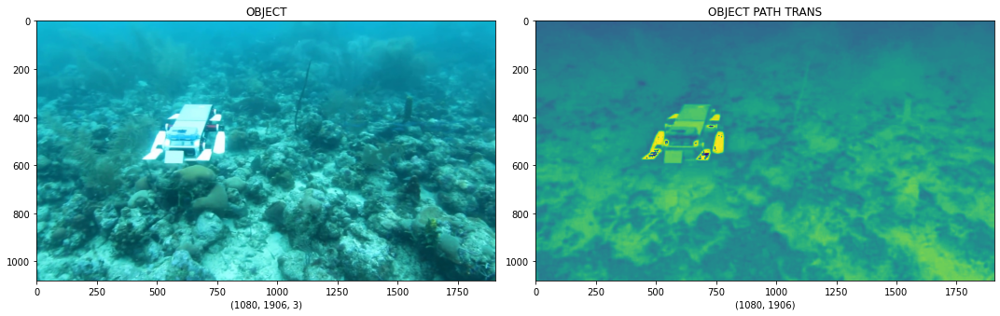

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][777]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][777]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,0] - (Red_I + Blue_I)

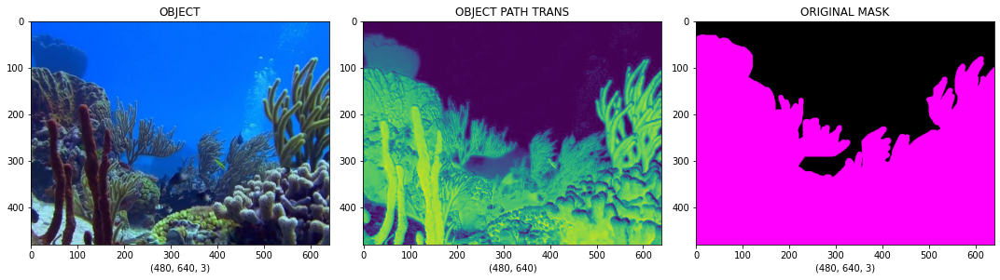

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,0] - (Red_I + Green_I + Blue_I)

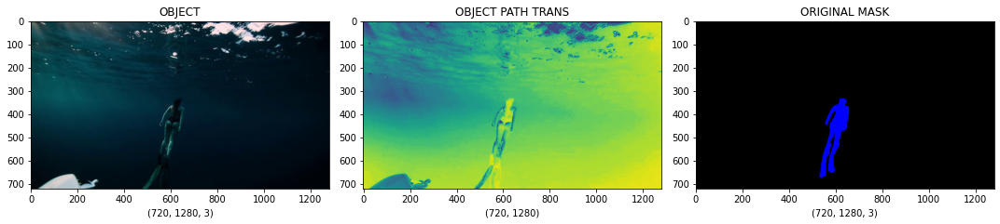

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,1] - Red_I

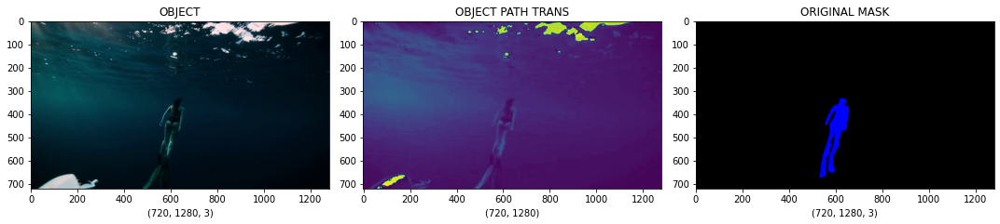

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][16]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][16]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_image)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,1] - Blue_I

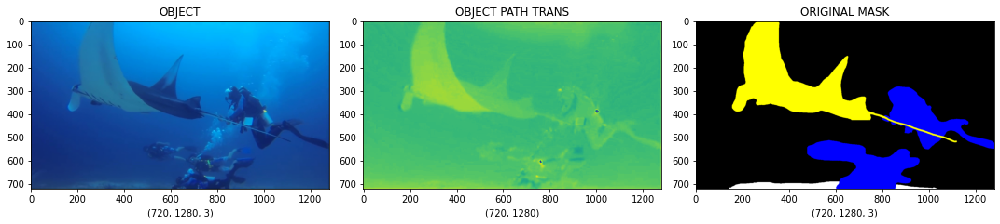

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
Red_I,Green_I,Blue_I = cv2.split(sample_mask)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
jpg_path_list_TRANS = COPY_OBJECT[:,:,0] == Green_I

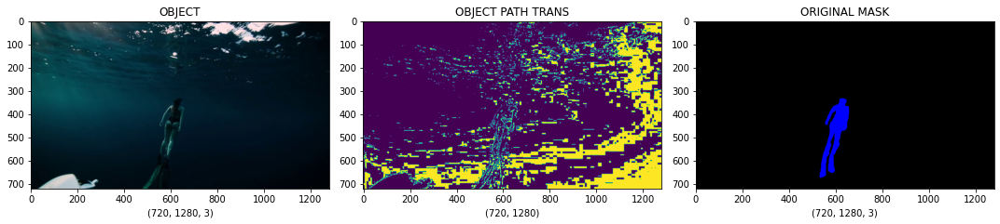

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(jpg_path_list_TRANS.shape)
axis[1].set_title("OBJECT PATH TRANS")
axis[1].imshow(jpg_path_list_TRANS)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_MASK = sample_mask.copy()

In [ ]:
COPY_MASK[:, :, 0] = 0

In [ ]:
COPY_MASK[:, :, 1] = 0

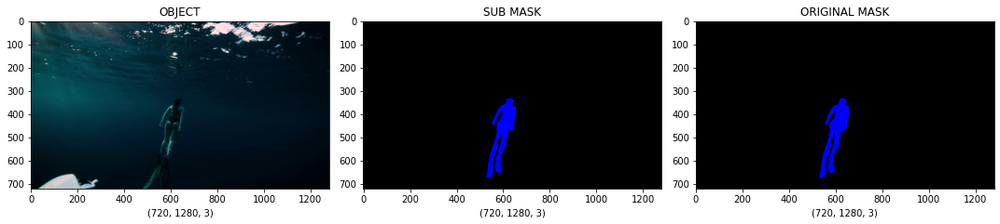

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(COPY_MASK.shape)
axis[1].set_title("SUB MASK")
axis[1].imshow(COPY_MASK)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][710]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][710]),cv2.COLOR_BGR2RGB)

In [ ]:
COPY_MASK = sample_mask.copy()

In [ ]:
COPY_MASK[:, :, 0] = 0

In [ ]:
COPY_MASK[:, :, 1] = 0

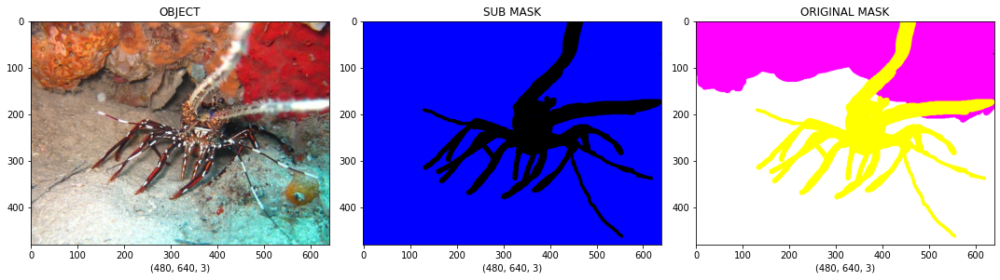

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(COPY_MASK.shape)
axis[1].set_title("SUB MASK")
axis[1].imshow(COPY_MASK)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
RED_COLOR_CODE = [255,0,0]
GREEN_COLOR_CODE = [0,255,0]
BLUE_COLOR_CODE = [0,0,255]

In [ ]:
YELLOW_COLOR_CODE = [255,255,0]
BLACK_COLOR_CODE = [0,0,0]
WHITE_COLOR_CODE = [255,255,255]

In [ ]:
PINK_COLOR_CODE = [255,192,203]
SKY_BLUE_COLOR_CODE = [135,206,235]

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][166]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][166]),cv2.COLOR_BGR2GRAY)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 0] = BLACK_COLOR_CODE

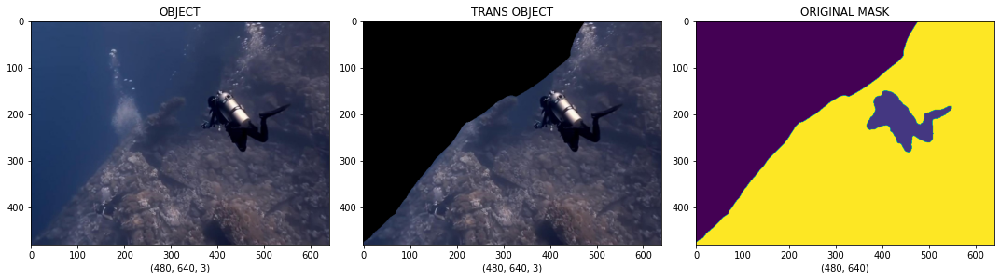

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(COPY_OBJECT.shape)
axis[1].set_title("TRANS OBJECT")
axis[1].imshow(COPY_OBJECT)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
sample_image = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][166]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_mask = cv2.cvtColor(cv2.imread(main_df["MASK"][166]),cv2.COLOR_BGR2GRAY)

In [ ]:
COPY_OBJECT = sample_image.copy()

In [ ]:
COPY_OBJECT[sample_mask == 0] = YELLOW_COLOR_CODE

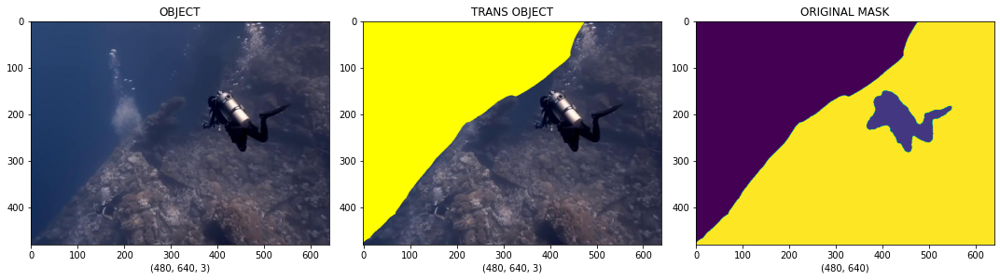

In [ ]:
figure,axis = plt.subplots(1,3,figsize=(15,15))
axis[0].set_xlabel(sample_image.shape)
axis[0].set_title("OBJECT")
axis[0].imshow(sample_image)
axis[1].set_xlabel(COPY_OBJECT.shape)
axis[1].set_title("TRANS OBJECT")
axis[1].imshow(COPY_OBJECT)
axis[2].set_xlabel(sample_mask.shape)
axis[2].set_title("ORIGINAL MASK")
axis[2].imshow(sample_mask)
plt.tight_layout()
plt.show()

In [ ]:
UPPER_BLUE = np.array([130,255,255])

In [ ]:
LOWER_BLUE = np.array([110,50,50])

In [ ]:
sample_image_RGB = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][66]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_image_HSV = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][66]),cv2.COLOR_BGR2HSV)

In [ ]:
BLUE_MASK = cv2.inRange(sample_image_HSV, LOWER_BLUE, UPPER_BLUE)

In [ ]:
RESULT_IMAGE_EXAMPLE = cv2.bitwise_and(sample_image_RGB, sample_image_RGB, mask=BLUE_MASK)

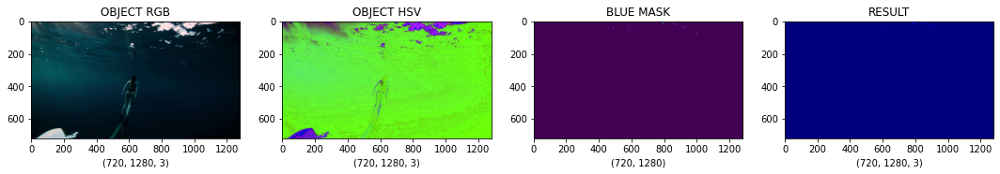

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image_RGB.shape)
axis[0].set_title("OBJECT RGB")
axis[0].imshow(sample_image_RGB)
axis[1].set_xlabel(sample_image_HSV.shape)
axis[1].set_title("OBJECT HSV")
axis[1].imshow(sample_image_HSV)
axis[2].set_xlabel(BLUE_MASK.shape)
axis[2].set_title("BLUE MASK")
axis[2].imshow(BLUE_MASK)
axis[3].set_xlabel(RESULT_IMAGE_EXAMPLE.shape)
axis[3].set_title("RESULT")
axis[3].imshow(RESULT_IMAGE_EXAMPLE[:,:,0],cmap="jet")
plt.tight_layout()
plt.show()

In [ ]:
sample_image_RGB = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][636]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_image_HSV = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][636]),cv2.COLOR_BGR2HSV)

In [ ]:
BLUE_MASK = cv2.inRange(sample_image_HSV, LOWER_BLUE, UPPER_BLUE)

In [ ]:
RESULT_IMAGE_EXAMPLE = cv2.bitwise_and(sample_image_RGB, sample_image_RGB, mask=BLUE_MASK)

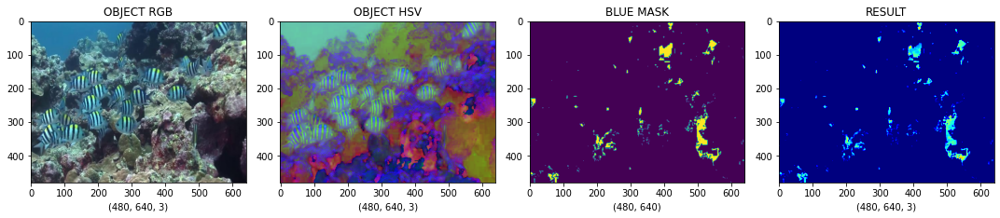

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image_RGB.shape)
axis[0].set_title("OBJECT RGB")
axis[0].imshow(sample_image_RGB)
axis[1].set_xlabel(sample_image_HSV.shape)
axis[1].set_title("OBJECT HSV")
axis[1].imshow(sample_image_HSV)
axis[2].set_xlabel(BLUE_MASK.shape)
axis[2].set_title("BLUE MASK")
axis[2].imshow(BLUE_MASK)
axis[3].set_xlabel(RESULT_IMAGE_EXAMPLE.shape)
axis[3].set_title("RESULT")
axis[3].imshow(RESULT_IMAGE_EXAMPLE[:,:,0],cmap="jet")
plt.tight_layout()
plt.show()

In [ ]:
sample_image_RGB = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][96]),cv2.COLOR_BGR2RGB)

In [ ]:
sample_image_HSV = cv2.cvtColor(cv2.imread(main_df["OBJECTS"][96]),cv2.COLOR_BGR2HSV)

In [ ]:
BLUE_MASK = cv2.inRange(sample_image_HSV, LOWER_BLUE, UPPER_BLUE)

In [ ]:
RESULT_IMAGE_EXAMPLE = cv2.bitwise_and(sample_image_RGB, sample_image_RGB, mask=BLUE_MASK)

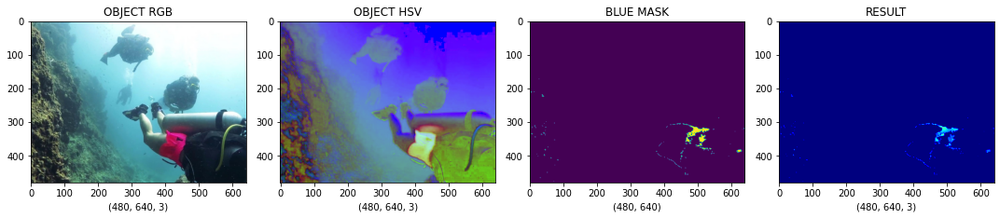

In [ ]:
figure,axis = plt.subplots(1,4,figsize=(15,15))
axis[0].set_xlabel(sample_image_RGB.shape)
axis[0].set_title("OBJECT RGB")
axis[0].imshow(sample_image_RGB)
axis[1].set_xlabel(sample_image_HSV.shape)
axis[1].set_title("OBJECT HSV")
axis[1].imshow(sample_image_HSV)
axis[2].set_xlabel(BLUE_MASK.shape)
axis[2].set_title("BLUE MASK")
axis[2].imshow(BLUE_MASK)
axis[3].set_xlabel(RESULT_IMAGE_EXAMPLE.shape)
axis[3].set_title("RESULT")
axis[3].imshow(RESULT_IMAGE_EXAMPLE[:,:,0],cmap="jet")
plt.tight_layout()
plt.show()

In [ ]:
def create_encoder_model():
    encoder_model = Sequential()
    encoder_model.add(Conv2D(32,(2,2),kernel_initializer = 'he_normal',padding = "same",use_bias = True))
    encoder_model.add(BatchNormalization())
    encoder_model.add(ReLU())
    encoder_model.add(Conv2D(64,(2,2),kernel_initializer = 'he_normal',padding = "same",use_bias = True))
    encoder_model.add(BatchNormalization())
    encoder_model.add(ReLU())
    encoder_model.add(Conv2D(128,(2,2),kernel_initializer = 'he_normal',padding = "same",use_bias = True))
    encoder_model.add(BatchNormalization())
    encoder_model.add(ReLU())
    return encoder_model

In [ ]:
def create_decoder_model():
    decoder_model = Sequential()
    decoder_model.add(Conv2DTranspose(32,(2,2),padding = "same",use_bias = True))
    decoder_model.add(BatchNormalization())
    decoder_model.add(ReLU())
    decoder_model.add( Conv2DTranspose(32,(2,2),padding = "same",use_bias = True))
    decoder_model.add(BatchNormalization())
    decoder_model.add(ReLU())
    decoder_model.add( Conv2DTranspose(output_class,(2,2),padding = "same",use_bias = True))
    decoder_model.add(BatchNormalization())
    decoder_model.add(ReLU())
    return decoder_model

In [ ]:
image_path = sorted(jpg_path_list)

In [ ]:
mask_path = sorted(bmp_path_list)

In [ ]:
image_series = pd.Series(image_path,name="OBJECTS").astype(str)

In [ ]:
image_series

0       Dataset\train_val\images\d_r_103_.jpg
1       Dataset\train_val\images\d_r_105_.jpg
2       Dataset\train_val\images\d_r_112_.jpg
3       Dataset\train_val\images\d_r_113_.jpg
4       Dataset\train_val\images\d_r_125_.jpg
                        ...                  
1520     Dataset\train_val\images\w_r_95_.jpg
1521     Dataset\train_val\images\w_r_96_.jpg
1522     Dataset\train_val\images\w_r_98_.jpg
1523     Dataset\train_val\images\w_r_99_.jpg
1524      Dataset\train_val\images\w_r_9_.jpg
Name: OBJECTS, Length: 1525, dtype: object

In [ ]:
mask_series = pd.Series(mask_path,name="MASK").astype(str)

In [ ]:
mask_series

0       Dataset\train_val\masks\d_r_103_.bmp
1       Dataset\train_val\masks\d_r_105_.bmp
2       Dataset\train_val\masks\d_r_112_.bmp
3       Dataset\train_val\masks\d_r_113_.bmp
4       Dataset\train_val\masks\d_r_125_.bmp
                        ...                 
1520     Dataset\train_val\masks\w_r_95_.bmp
1521     Dataset\train_val\masks\w_r_96_.bmp
1522     Dataset\train_val\masks\w_r_98_.bmp
1523     Dataset\train_val\masks\w_r_99_.bmp
1524      Dataset\train_val\masks\w_r_9_.bmp
Name: MASK, Length: 1525, dtype: object

In [ ]:
combined_data = pd.concat([image_series,mask_series],axis=1)

In [ ]:
combined_data

,OBJECTS,MASK
0,Dataset\train_val\images\d_r_103_.jpg,Dataset\train_val\masks\d_r_103_.bmp
1,Dataset\train_val\images\d_r_105_.jpg,Dataset\train_val\masks\d_r_105_.bmp
2,Dataset\train_val\images\d_r_112_.jpg,Dataset\train_val\masks\d_r_112_.bmp
3,Dataset\train_val\images\d_r_113_.jpg,Dataset\train_val\masks\d_r_113_.bmp
4,Dataset\train_val\images\d_r_125_.jpg,Dataset\train_val\masks\d_r_125_.bmp
...,...,...
1520,Dataset\train_val\images\w_r_95_.jpg,Dataset\train_val\masks\w_r_95_.bmp
1521,Dataset\train_val\images\w_r_96_.jpg,Dataset\train_val\masks\w_r_96_.bmp
1522,Dataset\train_val\images\w_r_98_.jpg,Dataset\train_val\masks\w_r_98_.bmp
1523,Dataset\train_val\images\w_r_99_.jpg,Dataset\train_val\masks\w_r_99_.bmp


In [ ]:
object_main_transformation= []

In [ ]:
mask_main_transformation = []

In [ ]:
main_transformation = []

In [ ]:
for x_image,x_mask in zip(combined_data.OBJECTS,combined_data.MASK):
    
    t_image_x = cv2.cvtColor(cv2.imread(x_image),cv2.COLOR_BGR2RGB)
    t_mask_x = cv2.cvtColor(cv2.imread(x_mask),cv2.COLOR_BGR2RGB)
    
    resized_x_image = cv2.resize(t_image_x,(300,300))
    resized_x_mask = cv2.resize(t_mask_x,(300,300))
    
    combined_x = cv2.addWeighted(resized_x_image,0.6,resized_x_mask,0.6,0.5)
    
    resized_x_combined = cv2.resize(combined_x,(300,300))
    
    mask_main_transformation.append(resized_x_image)
    object_main_transformation.append(resized_x_image)
    main_transformation.append(resized_x_combined)

In [ ]:
print("IMAGE SHAPE: ",np.shape(np.array(object_main_transformation)))

IMAGE SHAPE:  (1525, 300, 300, 3)


In [ ]:
print("MASK SHAPE: ",np.shape(np.array(mask_main_transformation)))

MASK SHAPE:  (1525, 300, 300, 3)


In [ ]:
print("ADD SHAPE: ",np.shape(np.array(main_transformation)))

ADD SHAPE:  (1525, 300, 300, 3)


In [ ]:
transformation_image = np.array(object_main_transformation,dtype="float32")

In [ ]:
transformation_mask = np.array(mask_main_transformation,dtype="float32")

In [ ]:
transformation_combined = np.array(main_transformation,dtype="float32")

In [ ]:
transformation_image = transformation_image / 255.

In [ ]:
transformation_mask = transformation_mask / 255.

In [ ]:
transformation_combined = transformation_combined / 255.

In [ ]:
print("TRAIN: ",transformation_image.shape)
print("TRANSFORMATION MASK: ",transformation_mask.shape)
print("TRANSFORMATION ADD: ",transformation_combined.shape)

TRAIN:  (1525, 300, 300, 3)
TRANSFORMATION MASK:  (1525, 300, 300, 3)
TRANSFORMATION ADD:  (1525, 300, 300, 3)


In [ ]:
compile_loss = "binary_crossentropy"

In [ ]:
output_class=3

In [ ]:
no_of_epochs = 30

In [ ]:
model_optimizer = Adam(learning_rate=0.000001)

In [ ]:
checkpoint = ModelCheckpoint(monitor="val_accuracy", save_best_only=True, save_weights_only=True, filepath="./modelcheckpoint")

In [ ]:
en_de_coder_model = Sequential([create_encoder_model(), create_decoder_model()])

In [ ]:
en_de_coder_model.compile(loss=compile_loss, optimizer=model_optimizer, metrics=["mse"])

In [ ]:
can_train = False

In [ ]:
if can_train == True:
    en_de_coder_model_history = en_de_coder_model.fit(transformation_image, transformation_mask, epochs=no_of_epochs, callbacks=[])
    en_de_coder_model.save('Encoder-Decoder-1.keras')
else:
    en_de_coder_model = load_model('Encoder-Decoder-1.keras')

In [ ]:
predictions = en_de_coder_model.predict(transformation_image[:10])

1/1 [==============================] - 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


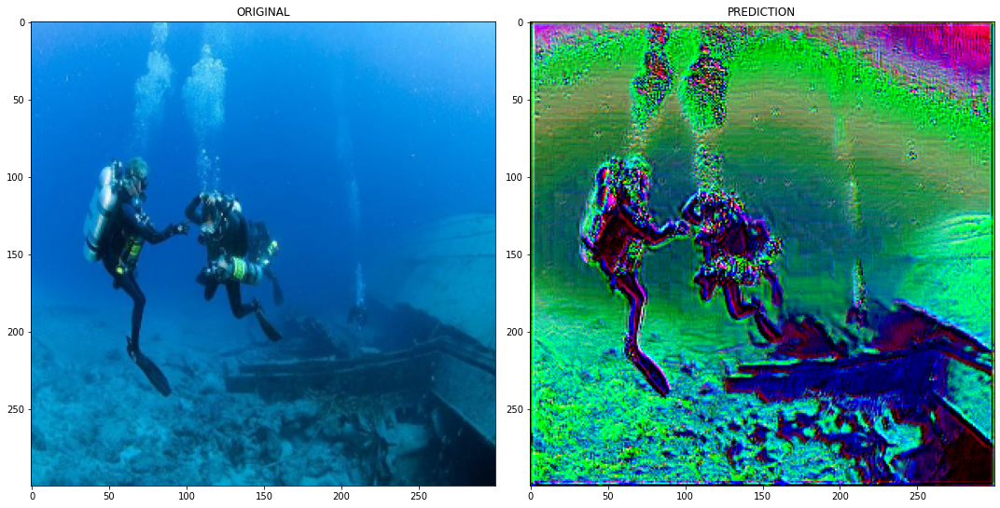

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = np.random.randint(0,5)

axis[0].imshow(transformation_image[PRE_COUNT])
axis[0].set_title("ORIGINAL")
axis[1].imshow(predictions[PRE_COUNT])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


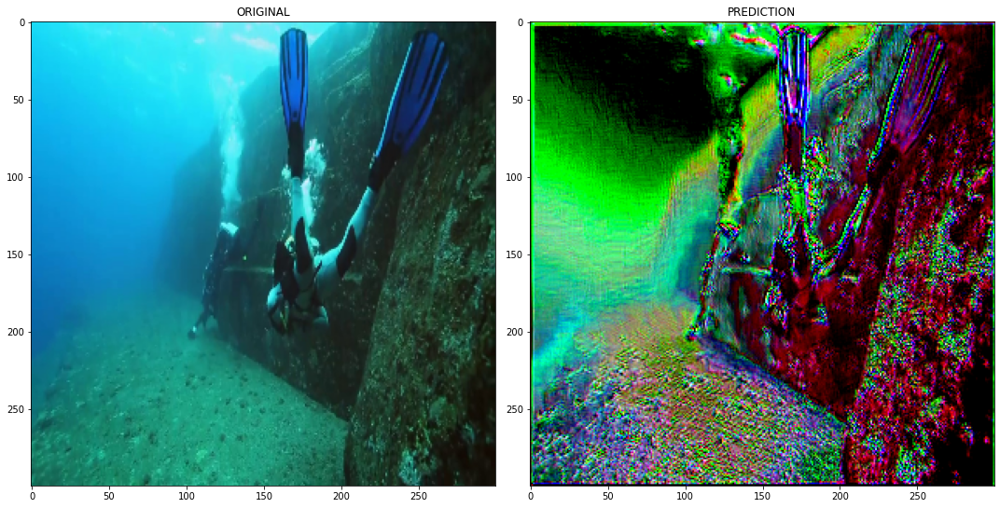

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = np.random.randint(5,10)

axis[0].imshow(transformation_image[PRE_COUNT])
axis[0].set_title("ORIGINAL")
axis[1].imshow(predictions[PRE_COUNT])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


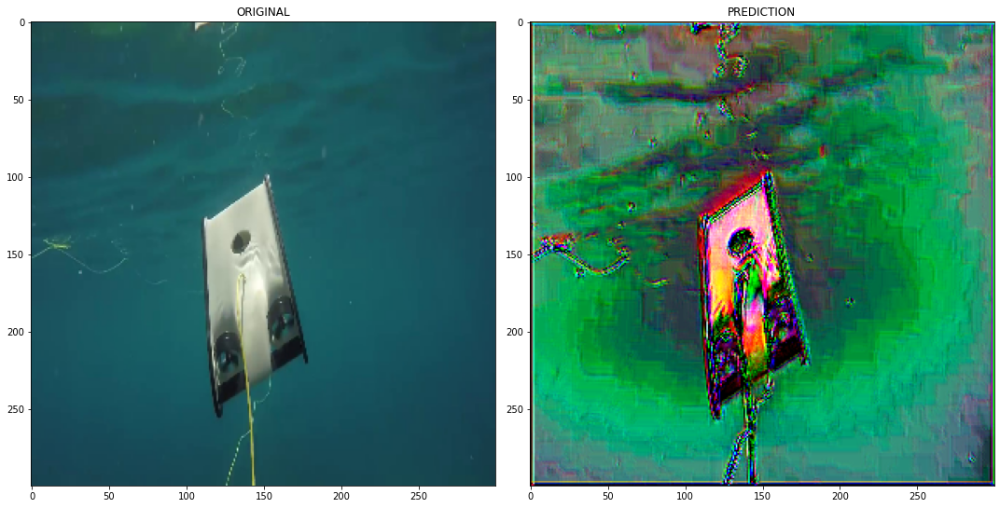

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = 5

axis[0].imshow(transformation_image[PRE_COUNT])
axis[0].set_title("ORIGINAL")
axis[1].imshow(predictions[PRE_COUNT])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


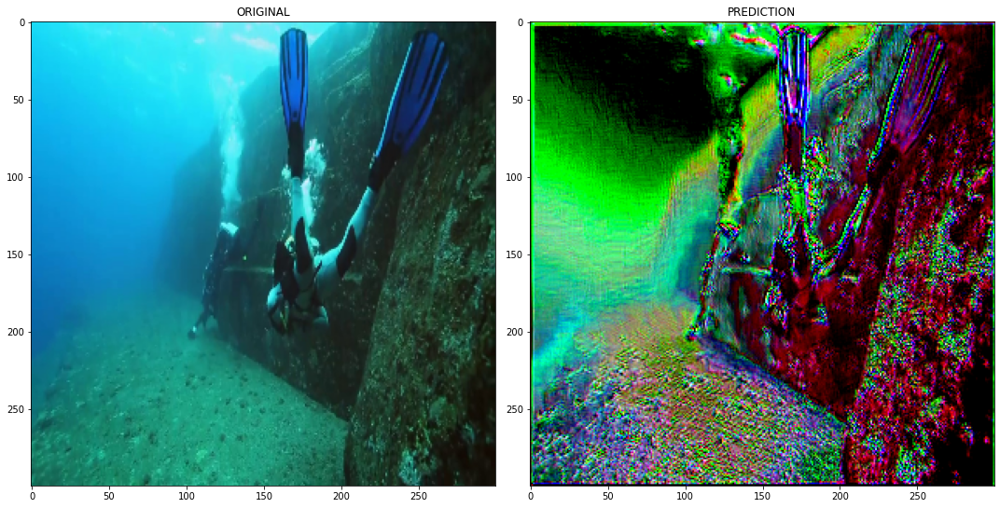

In [ ]:
figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = 9

axis[0].imshow(transformation_image[PRE_COUNT])
axis[0].set_title("ORIGINAL")
axis[1].imshow(predictions[PRE_COUNT])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 315ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


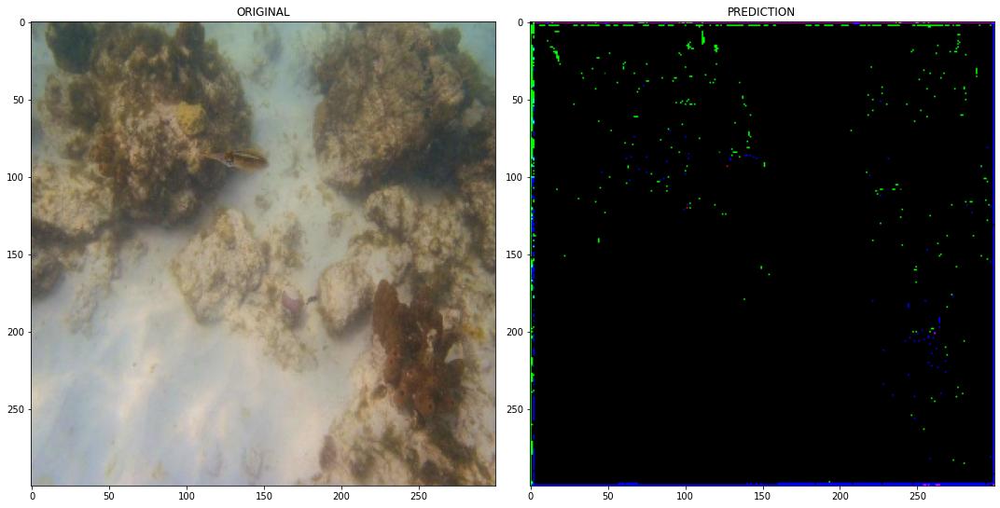

In [ ]:
NON_SEEN_PATH = "Dataset/TEST/images/d_r_129_.jpg"

IMAGE_NON_SEEN = cv2.cvtColor(cv2.imread(NON_SEEN_PATH),cv2.COLOR_BGR2RGB)

RESIZED_NON_SEEN = cv2.resize(IMAGE_NON_SEEN,(300,300))

RESIZED_NON_SEEN = RESIZED_NON_SEEN.reshape(1,RESIZED_NON_SEEN.shape[0],RESIZED_NON_SEEN.shape[1],RESIZED_NON_SEEN.shape[2])

Prediction_Non_Seen = en_de_coder_model.predict(RESIZED_NON_SEEN)

figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = 9

axis[0].imshow(RESIZED_NON_SEEN[0])
axis[0].set_title("ORIGINAL")
axis[1].imshow(Prediction_Non_Seen[0])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 122ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


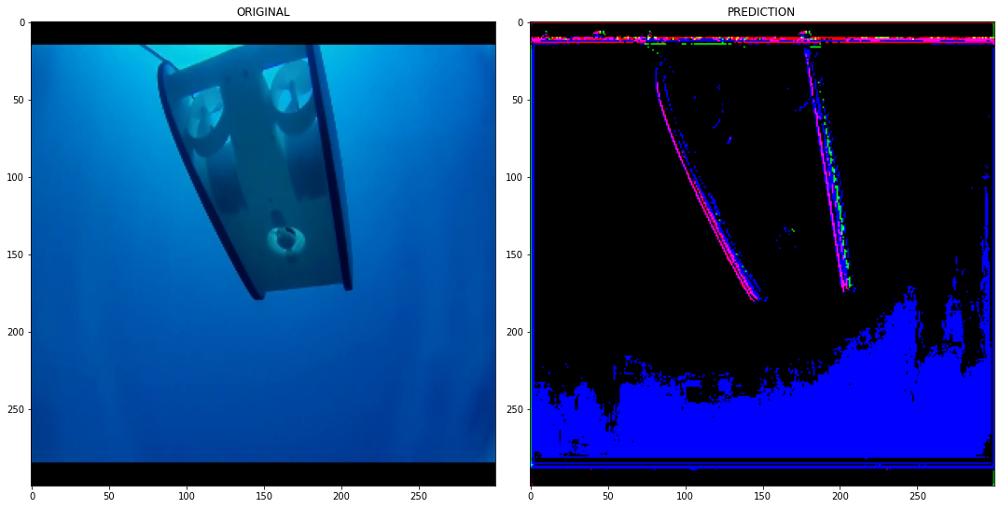

In [ ]:
NON_SEEN_PATH = "Dataset/TEST/images/d_r_384_.jpg"

IMAGE_NON_SEEN = cv2.cvtColor(cv2.imread(NON_SEEN_PATH),cv2.COLOR_BGR2RGB)

RESIZED_NON_SEEN = cv2.resize(IMAGE_NON_SEEN,(300,300))

RESIZED_NON_SEEN = RESIZED_NON_SEEN.reshape(1,RESIZED_NON_SEEN.shape[0],RESIZED_NON_SEEN.shape[1],RESIZED_NON_SEEN.shape[2])

Prediction_Non_Seen = en_de_coder_model.predict(RESIZED_NON_SEEN)

figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = 9

axis[0].imshow(RESIZED_NON_SEEN[0])
axis[0].set_title("ORIGINAL")
axis[1].imshow(Prediction_Non_Seen[0])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 150ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


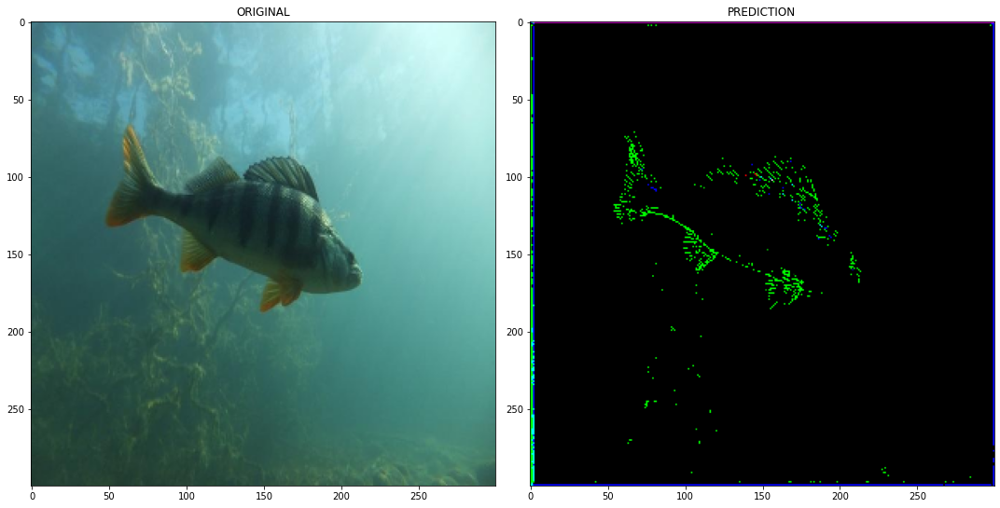

In [ ]:
NON_SEEN_PATH = "Dataset/TEST/images/f_r_1220_.jpg"

IMAGE_NON_SEEN = cv2.cvtColor(cv2.imread(NON_SEEN_PATH),cv2.COLOR_BGR2RGB)

RESIZED_NON_SEEN = cv2.resize(IMAGE_NON_SEEN,(300,300))

RESIZED_NON_SEEN = RESIZED_NON_SEEN.reshape(1,RESIZED_NON_SEEN.shape[0],RESIZED_NON_SEEN.shape[1],RESIZED_NON_SEEN.shape[2])

Prediction_Non_Seen = en_de_coder_model.predict(RESIZED_NON_SEEN)

figure,axis = plt.subplots(1,2,figsize=(15,15))

PRE_COUNT = 9

axis[0].imshow(RESIZED_NON_SEEN[0])
axis[0].set_title("ORIGINAL")
axis[1].imshow(Prediction_Non_Seen[0])
axis[1].set_title("PREDICTION")

plt.tight_layout()
plt.show()

In [ ]:
dict = {'classes': ['Background', 'Human divers', 'Aquatic plants and sea-grass', 'Wrecks and ruins', 'Robots', 'Reefs and invertebrates', 'Fish and vertebrates', 'Sea-floor and rocks'], 
        'colors': [(0,0,0), (0,0,255), (0,255,0), (0,255,255), (255,0,0), (255,0,255), (255,255,0), (255,255,255)]}

In [ ]:
img_dim = (256,256,3)

In [ ]:
perc_train = 0.8

In [ ]:
batch_size=32

In [ ]:
n_classes=8

In [ ]:
paths = []

In [ ]:
for dirname, _, filenames in os.walk("Dataset/train_val"):
    for filename in filenames:
        paths.append(os.path.join(dirname, filename))

In [ ]:
in_files = [x for x in paths if x.endswith('jpg')]

In [ ]:
lab_files = [x for x in paths if x.endswith('bmp')]

In [ ]:
in_files.sort()
lab_files.sort()

In [ ]:
def labelize(label):
    m,n,b = label.shape
    ref = np.zeros((m,n))
    for i,col in enumerate(dict['colors']):
        ref[np.all(label == col,axis=-1)] = i
    return ref

In [ ]:
def jaccard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

In [ ]:
class DataGenerator(Sequence):
    def __init__(self, list_IDs, list_labels, batch_size=32, img_dim = (256,256), n_channels = 3, n_classes=10, shuffle=True):
        self.dim = img_dim
        self.batch_size = batch_size
        self.labels = list_labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        list_lab_temp = [self.labels[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp, list_lab_temp)

        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp, list_labels):
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim), dtype=int)

        for i, ID in enumerate(list_IDs_temp):
            X[i,] = img_to_array(load_img(ID,target_size = ( *self.dim, self.n_channels), interpolation = 'bicubic'))/255
            yy = img_to_array(load_img(list_labels[i], target_size = ( *self.dim, self.n_channels), interpolation= 'nearest'))
            y[i,] = labelize(yy)
        return X, to_categorical(y, num_classes=self.n_classes)


In [ ]:
# Encoder Decoder 2

In [ ]:
inputs = Input(img_dim)

In [ ]:
def create_encoder_decoder_model_2(inputs):
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
    return c9

In [ ]:
def create_unet_model(inputs):
    outputs = Conv2D(n_classes, (1, 1), activation='softmax')(create_encoder_decoder_model_2(inputs))
     
    unet_model = Model(inputs=[inputs], outputs=[outputs])
    return unet_model

In [ ]:
metrics=['accuracy', jaccard_coef]

In [ ]:
loss = sm.losses.DiceLoss() 

In [ ]:
unet_model= create_unet_model(inputs)

In [ ]:
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_5 (Conv2D)              (None, 256, 256, 16  2320        ['conv2d_4[0][0]']               
                                )                                                             

                                )                                                                 
                                                                                                  
 conv2d_3 (Conv2D)              (None, 256, 256, 8)  136         ['conv2d_21[0][0]']              
                                                                                                  
Total params: 1,941,224
Trainable params: 1,941,224
Non-trainable params: 0
__________________________________________________________________________________________________


In [ ]:
unet_model.compile(optimizer='adam', loss=loss, metrics=metrics)

In [ ]:
EarlyStop=EarlyStopping(patience=10,restore_best_weights=True)

In [ ]:
Reduce_LR=ReduceLROnPlateau(monitor='val_accuracy',verbose=2,factor=0.5,min_lr=0.00001)

In [ ]:
model_check=ModelCheckpoint('model.hdf5',monitor='val_loss',verbose=1,save_best_only=True)

In [ ]:
callback=[EarlyStop , Reduce_LR,model_check]

In [ ]:
L = len(in_files)

In [ ]:
indices = np.arange(L)

In [ ]:
L1 = int(L*perc_train)

In [ ]:
t_gen = DataGenerator(in_files[:L1], lab_files[:L1], batch_size=batch_size, img_dim = (256,256), n_channels = 3, n_classes=8, shuffle=True)

In [ ]:
v_gen = DataGenerator(in_files[L1:], lab_files[L1:], batch_size=batch_size, img_dim = (256,256), n_channels = 3, n_classes=8, shuffle=True)

In [ ]:
if can_train:
    unet_history = unet_model.fit(t_gen, 
                        verbose=1, 
                        epochs=no_of_epochs, 
                        validation_data=v_gen)
    unet_model.save('UNet-Model.keras')
else:
    unet_model = load_model('UNet-Model.keras', compile=False)
    

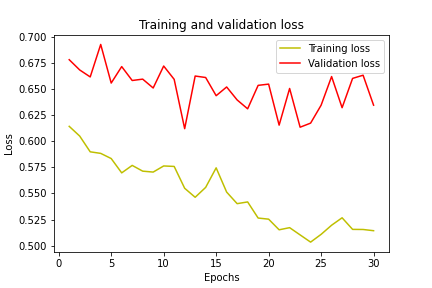

In [ ]:
if can_train:
    loss = unet_history.history['loss']
    val_loss = unet_history.history['val_loss']
    epochs = range(1, len(loss) + 1)
    plt.plot(epochs, loss, 'y', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig('./Output/Training-and-Validation-Loss.png')
    plt.show()
    
else:
    display(WImage(filename='./Output/Training-and-Validation-Loss.png') )

In [ ]:
if can_train:
    acc = unet_history.history['jaccard_coef']
    val_acc = unet_history.history['val_jaccard_coef']

    plt.plot(epochs, acc, 'y', label='Training IoU')
    plt.plot(epochs, val_acc, 'r', label='Validation IoU')
    plt.title('Training and validation IoU')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()
    plt.savefig('./Output/Training-and-Validation-IoU.png')
    plt.show()
    
else:
    WImage(filename='./Output/Training-and-Validation-IoU.png') 

In [ ]:
base = r"Dataset/TEST"
t_in_files = []
t_lab_files = []
imgs = os.listdir(os.path.join(base,'images'))
for img in imgs:
    t_in_files.append(os.path.join(base,'images', img))
    t_lab_files.append(os.path.join(base,'masks', img[:-3] + 'bmp'))
t_in_files.sort()
t_lab_files.sort()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(256, 256, 3)
[0. 1. 4. 7.]
(256, 256)


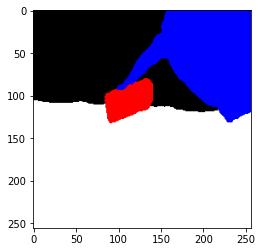

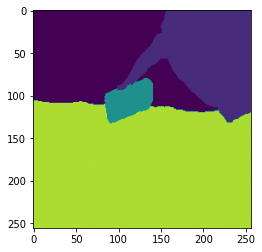

In [ ]:
a = img_to_array(load_img(t_lab_files[0], target_size = img_dim, interpolation= 'nearest'))
print(a.shape)
plt.figure()
plt.imshow(a)
b = labelize(a)
print(np.unique(b))
print(b.shape)
plt.figure()
plt.imshow(b,vmin=0, vmax= n_classes)

In [ ]:
test_set = []
test_lab = []

In [ ]:
for i in range(len(t_in_files)):
    test_set.append(img_to_array(load_img(t_in_files[i],target_size = img_dim, interpolation = 'bicubic'))/255)
    yy = img_to_array(load_img(t_lab_files[i], target_size = img_dim, interpolation= 'nearest'))
    test_lab.append(to_categorical(labelize(yy),num_classes=8))

In [ ]:
test_set = np.asarray(test_set)
test_lab = np.asarray(test_lab)

In [ ]:
y_pred=unet_model.predict(test_set)

4/4 [==============================] - 3s 663ms/step


In [ ]:
Jacc = jaccard_coef(test_lab,y_pred)

In [ ]:
print('IoU = {}'.format(Jacc))

IoU = 0.5371611714363098


In [ ]:
y_pred_argmax=np.argmax(y_pred, axis=3)
y_test_argmax=np.argmax(test_lab, axis=3)

In [ ]:
num_samples = 10

In [ ]:
test_img_numbers = random.sample(range(test_set.shape[0]), num_samples)

1/1 [==============================] - 0s 84ms/step


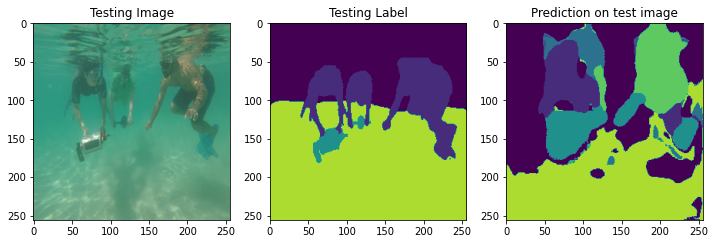

1/1 [==============================] - 0s 83ms/step


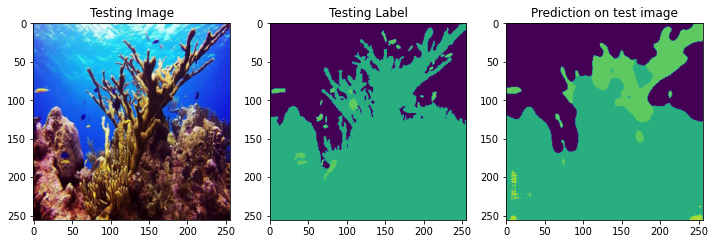

1/1 [==============================] - 0s 83ms/step


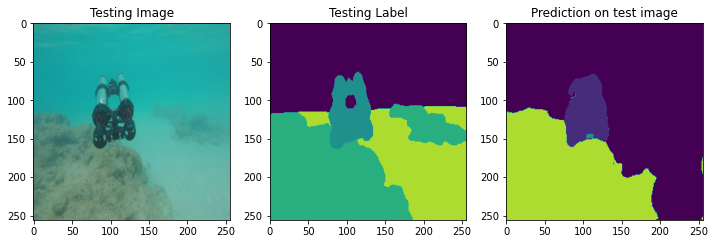

1/1 [==============================] - 0s 92ms/step


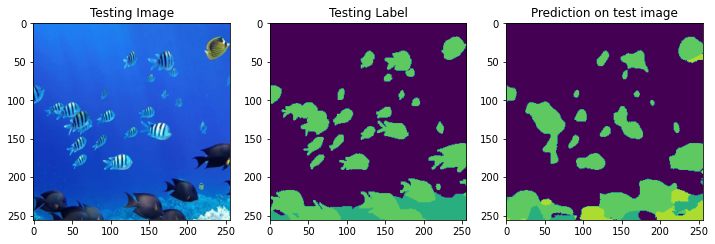

1/1 [==============================] - 0s 84ms/step


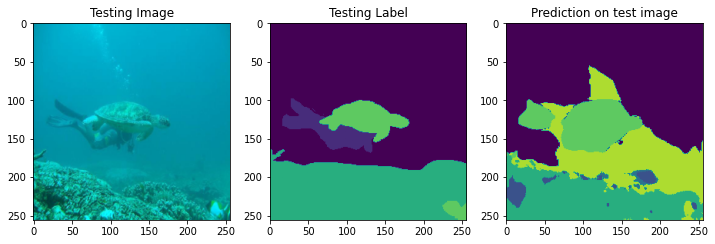

1/1 [==============================] - 0s 83ms/step


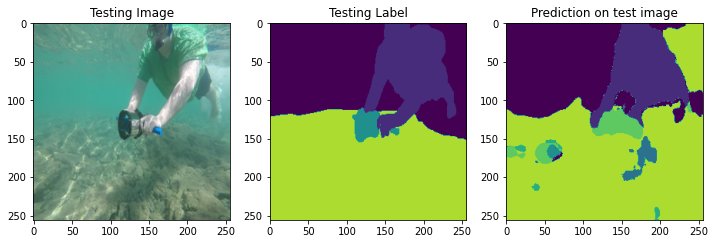

1/1 [==============================] - 0s 82ms/step


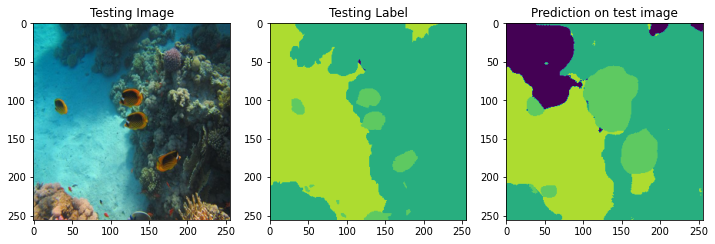

1/1 [==============================] - 0s 80ms/step


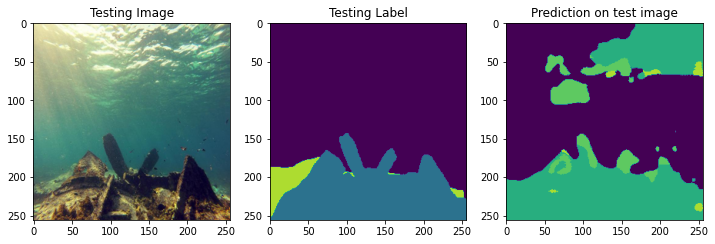

1/1 [==============================] - 0s 88ms/step


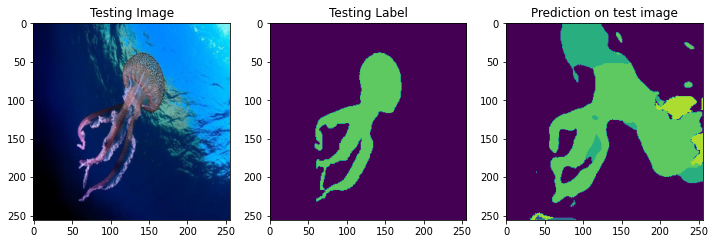

1/1 [==============================] - 0s 91ms/step


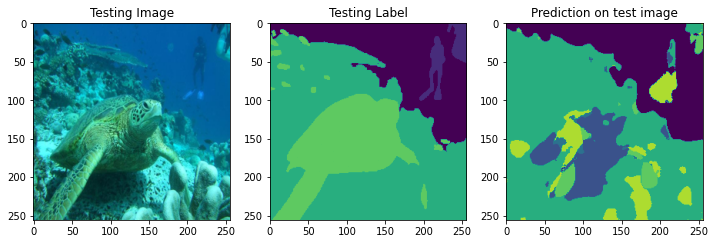

In [ ]:
for test_img_number in test_img_numbers:
    test_img = test_set[test_img_number]
    ground_truth=y_test_argmax[test_img_number]
    #test_img_norm=test_img[:,:,0][:,:,None]
    test_img_input=np.expand_dims(test_img, 0)
    prediction = (unet_model.predict(test_img_input))
    predicted_img=np.argmax(prediction, axis=3)[0,:,:]
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Testing Image')
    plt.imshow(test_img)
    plt.subplot(232)
    plt.title('Testing Label')
    plt.imshow(ground_truth, vmin=0, vmax = n_classes)
    plt.subplot(233)
    plt.title('Prediction on test image')
    plt.imshow(predicted_img, vmin=0, vmax = n_classes)
    plt.show()